The directory structure
```
root folder    
│
└───covid
│       │   image11.jpeg
│       │   image22.jpeg
│       │   ...
│   
└───normal
│       │   imagexx.jpeg
│       │   imagyy.jpeg
│       │   ...
└───pneumonia
│       │   imagezz.jpeg
│       │   imagehh.jpeg
│       │   ...
└───out
│   │
│   └───train
│         └───covid
│         └───normal
│         └───pneumonia
│   │
│   └───test
│         └───covid
│         └───normal
│         └───pneumonia

```

In [ ]:
#Run this cell to upgrade your matplotlib to the latest version and restart runtime if you're facing issues with plotting below cells
#!pip install matplotlib --upgrade

In [1]:
import numpy as np
import pandas as pd

import glob, random, os, warnings
import matplotlib.pyplot as plt
from datetime import datetime
from tqdm import tqdm
import seaborn as sns
from time import time
import time as t
import shutil
import cv2

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report, ConfusionMatrixDisplay


import tensorflow as tf
import tensorflow.keras.layers as L
from tensorflow.keras.layers import *
from tensorflow.keras.preprocessing.image import ImageDataGenerator

#To get the same results in different environments
def seed_everything(seed = 0):
    random.seed(seed)
    np.random.seed(seed)
    tf.random.set_seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    os.environ['TF_DETERMINISTIC_OPS'] = "True"
    os.environ["TF_DISABLE_SEGMENT_REDUCTION_OP_DETERMINISM_EXCEPTIONS"] = "True"

seed_everything()
warnings.filterwarnings('ignore')


print('TensorFlow Version ' + tf.__version__)

TensorFlow Version 2.9.2


# **Define Parameters**

In [32]:
image_size = 224
batch_size = 32
n_classes = 3
learning_rate = 0.001
weight_decay = 0.0001
num_epochs = 150

**We have 3 classes as our output.**
* pneumonia
* covid
* normal

In [33]:
class_to_label_map = {'pneumonia' : 2, 'covid' : 1, 'normal' : 0}

Metadata that is provided in the dataset has some mismatches with the actual file names. So let's create a DataFrame ourselved with the data!

In [34]:
df = pd.DataFrame(columns =['class', 'directory'])  
for path, names, filenames in os.walk('/normal'):
    for filename in filenames:
        df.loc[-1] = ["normal", ('normal/' + filename)] 
        df.index = df.index + 1 
        df = df.sort_index() 
for path, names, filenames in os.walk('/covid'):
    for filename in filenames:
        df.loc[-1] = ["covid", ('covid/' + filename)] 
        df.index = df.index + 1 
        df = df.sort_index() 
for path, names, filenames in os.walk('/pneumonia'):
    for filename in filenames:
        df.loc[-1] = ["pneumonia", ('pneumonia/' + filename)] 
        df.index = df.index + 1 
        df = df.sort_index()

We have it, we can start working with it now!

In [35]:
df

,class,directory
0,pneumonia,pneumonia/person1488_virus_2585.jpeg
1,pneumonia,pneumonia/person1446_bacteria_3740.jpeg
2,pneumonia,pneumonia/person1430_virus_2444.jpeg
3,pneumonia,pneumonia/person1449_bacteria_3747.jpeg
4,pneumonia,pneumonia/person1455_bacteria_3784.jpeg
...,...,...
4570,normal,normal/00000389_000.png
4571,normal,normal/00000401_000.png
4572,normal,normal/00000391_007.png
4573,normal,normal/00000403_001.png


# **E**xploratory **D**ata **A**nalysis

Let's check if there's any imbalance in the data!

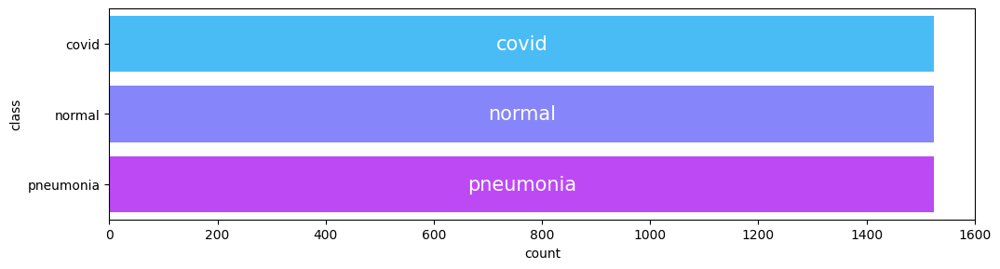

In [6]:
plt.rcParams['figure.dpi'] = 100
plt.style.use('tableau-colorblind10')

plt.figure(figsize=(12,3))
splot = sns.countplot(data = df.sort_values(by='class'), y ='class', palette='cool', saturation=0.9)
plt.bar_label(container=splot.containers[0], 
              labels=['covid', 'normal', 'pneumonia'], 
              label_type='center', size=15, color='w')

plt.show()

<AxesSubplot: ylabel='count'>

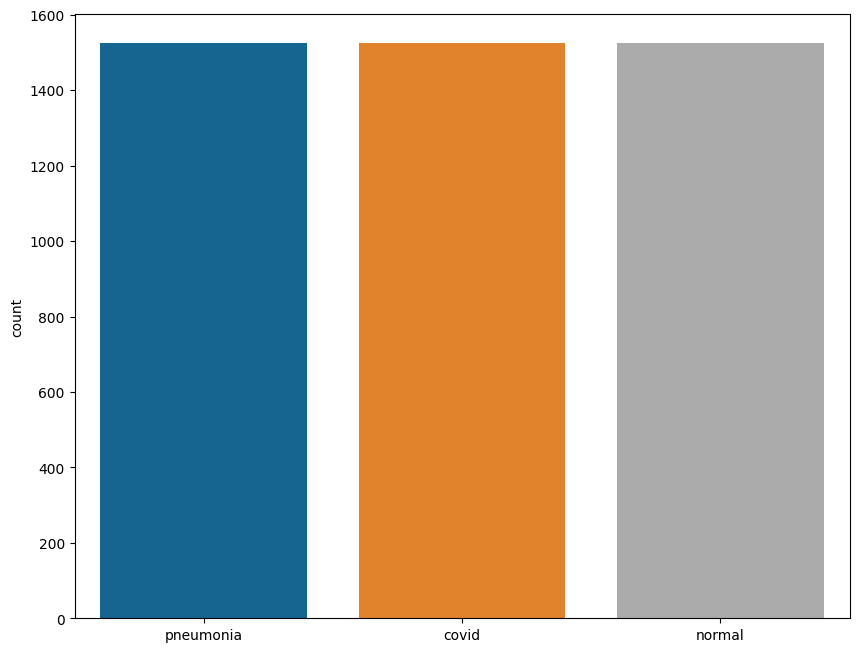

In [7]:
labels = df['class'].values
plt.figure(figsize = (10,8))
sns.countplot(x =labels)

Dataset is balanced, that's good!

Let's see one of the pictures and its attributes!

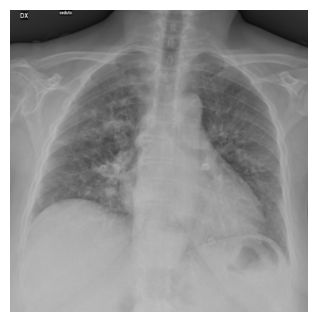

Image Shape: (1083, 1068, 3)

Image Height: 1083

Image Width: 1068

Image Dimension: 3

Image Size: 3388kb

Image Data Type: uint8

Maximum RGB value of the image: 255

Minimum RGB value of the image: 0


In [8]:
plt.figure()
image = cv2.imread("/covid/03BF7561-A9BA-4C3C-B8A0-D3E585F73F3C-1068x1083.jpeg")
plt.imshow(image)
plt.axis('off')
plt.show() 

print('Image Shape: {}'.format(image.shape))
print('Image Height: {}'.format(image.shape[0]))
print('Image Width: {}'.format(image.shape[1]))
print('Image Dimension: {}'.format(image.ndim))
print('Image Size: {}kb'.format(image.size//1024))
print('Image Data Type: {}'.format(image.dtype))
print('Maximum RGB value of the image: {}'.format(image.max()))
print('Minimum RGB value of the image: {}'.format(image.min()))

Let's create Train & Test sets. 

* **Train set --> 80%**
* **Test set --> 20%**

In [36]:
X_train, X_test, Y_train, Y_test = train_test_split(df['directory'], df['class'], stratify= df['class'], test_size=0.20, random_state=1)

In [37]:
print(f"""
{'-'*40}
# Train samples: {Y_train.shape}
# Test samples: {Y_test.shape}
{'-'*40}
""")



----------------------------------------

# Train samples: (3660,)

# Test samples: (915,)

----------------------------------------




Let's copy images into train & test folders so that we can load them into Tensorflow **ImageDataGenerator**. Below is a custom method to copy images according to the dataframes we created as train & test sets!

In [15]:
def copy_images(df, directory):
    input_path = ""
    output_path = "out/" + directory 
    
    #if any old file exists in ouput path, it is removed
    if os.path.exists(output_path):
        shutil.rmtree(output_path)
        
    #creating folder inside output path
    if not os.path.exists(output_path):
        os.makedirs(output_path)
    
    #these three subfolders
    classes = ['normal', 'covid', 'pneumonia']
    for c in classes:
        if not os.path.exists(output_path + '/' + c):
            os.makedirs(output_path + '/' + c)
    
    #the original dataframe containing directory for each row, those directory are shifted from path_from to path_to
    #(that is from input directory to ouput directory)
    for i, row in df.iterrows():
        path_from = "{}/{}".format(input_path, row['directory'])
        path_to = "{}/{}".format(output_path, row['directory'])
        shutil.copy(path_from, path_to)

In [38]:
df_test = pd.concat([X_test, Y_test], axis = 1)
df_train = pd.concat([X_train, Y_train], axis = 1)

#copy_images(df_test, 'test')
#copy_images(df_train, 'train')

Here I import one of the images, then turn it into a tensor. Finally, I plot it. We'll use this image to show data augmentation techniques in the cell below this cell.

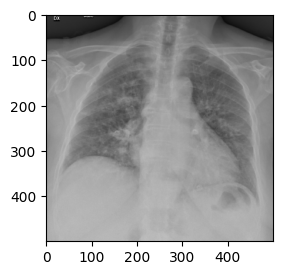

In [12]:
image_path = '/covid/03BF7561-A9BA-4C3C-B8A0-D3E585F73F3C-1068x1083.jpeg'
#Loads image in from the set image path
img = tf.keras.preprocessing.image.load_img(image_path, target_size= (500,500))
img_tensor = tf.keras.preprocessing.image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
#Allows us to properly visualize our image by rescaling values in array
img_tensor /= 255.
#Plots image
plt.figure(figsize=(3,3))
plt.imshow(img_tensor[0])
plt.show()

## **Data Augmentation**
These are the images we can produce with the data augmentation to improve the accuracy of our model.

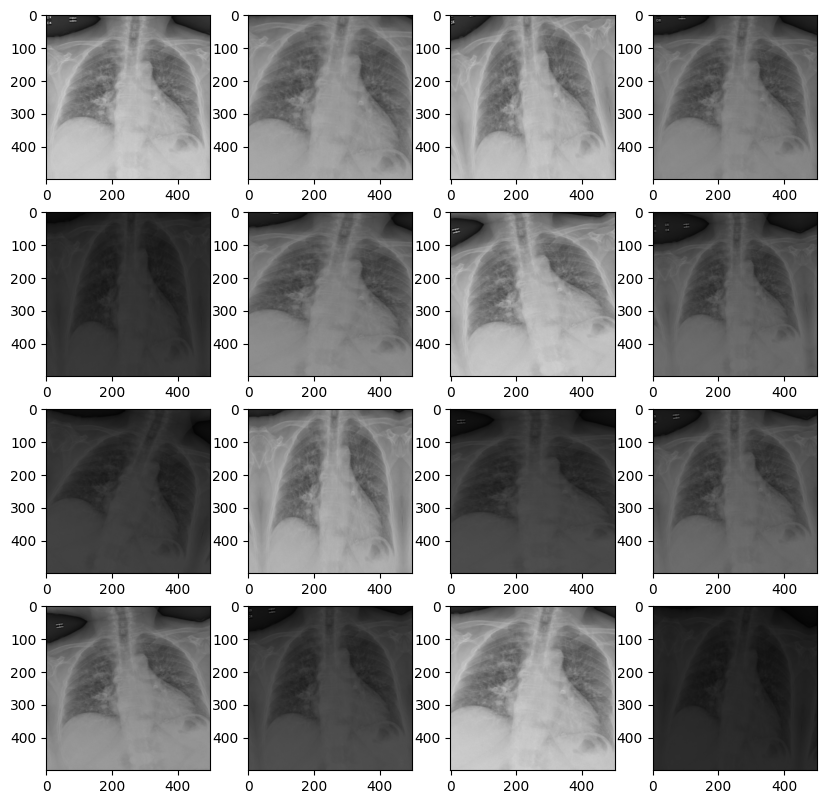

In [13]:
datagen = ImageDataGenerator(featurewise_center = "True",
                            featurewise_std_normalization = "True",
                            shear_range = 0.25,
                            zoom_range = 0.2,
                            rotation_range = 15,
                            brightness_range = [0.15, 1.15],
                            width_shift_range = [-2,-1, 0, +1, +2],
                            height_shift_range = [ -1, 0, +1],
                            fill_mode = 'reflect')
#Creates our batch of one image
pic = datagen.flow(img_tensor*255, batch_size =1)
plt.figure(figsize=(10, 10))
#Plots our figures
for i in range(1,17):
    plt.subplot(4, 4, i)
    batch = pic.next()
    image_ = batch[0].astype('uint8')
    plt.imshow(image_)
plt.show()

# **ImageDataGenerator**
ImageDataGenerator of Keras helps us generate batches of tensor image data with real-time data augmentation. This way, we don't suffer from not enough memory since every image is being loaded to memory one-by-one with this generator.
Therefore we're creating :
* Training
* Validation
* Test
data generators for our model

**!!!!!** We have different ImageDataGenerators for **(train&validation)** and **(test)** sets. We don't want to change anything in test set so we're doing it in a seperate line!

In [39]:
test_path = 'out/test'
train_path = 'out/train'

#Data augmentation methods are applied here!
datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255,
                                                            validation_split = 0.2,
                                                            featurewise_center = "True",
                                                            featurewise_std_normalization = "True",
                                                            shear_range = 0.25,
                                                            zoom_range = 0.2,
                                                            rotation_range = 15,
                                                            brightness_range = [0.15, 1.15],
                                                            width_shift_range = [-2,-1, 0, +1, +2],
                                                            height_shift_range = [ -1, 0, +1],
                                                            fill_mode = 'reflect')

#Different generator
test_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)

train_gen = datagen.flow_from_dataframe(dataframe = df_train,
                                        directory = train_path,
                                        x_col = 'directory',
                                        y_col = 'class',
                                        subset = 'training',
                                        batch_size = batch_size,
                                        seed = 1,
                                        color_mode = 'grayscale',
                                        shuffle = True,
                                        class_mode = 'categorical',
                                        target_size = (image_size, image_size))

valid_gen = datagen.flow_from_dataframe(dataframe = df_train,
                                        directory = train_path,
                                        x_col = 'directory',
                                        y_col = 'class',
                                        subset = 'validation',
                                        batch_size = batch_size,
                                        seed = 1,
                                        color_mode = 'grayscale',
                                        shuffle = True,
                                        class_mode = 'categorical',
                                        target_size = (image_size, image_size))


test_gen = test_datagen.flow_from_directory(
    directory=test_path,
    color_mode="grayscale",
    batch_size=1,
    class_mode=None,
    shuffle=False,
    seed=1,
    target_size = (image_size, image_size)
)

Found 2928 validated image filenames belonging to 3 classes.

Found 732 validated image filenames belonging to 3 classes.

Found 915 images belonging to 3 classes.


# **Model 1 -Custom Sequential CNN**
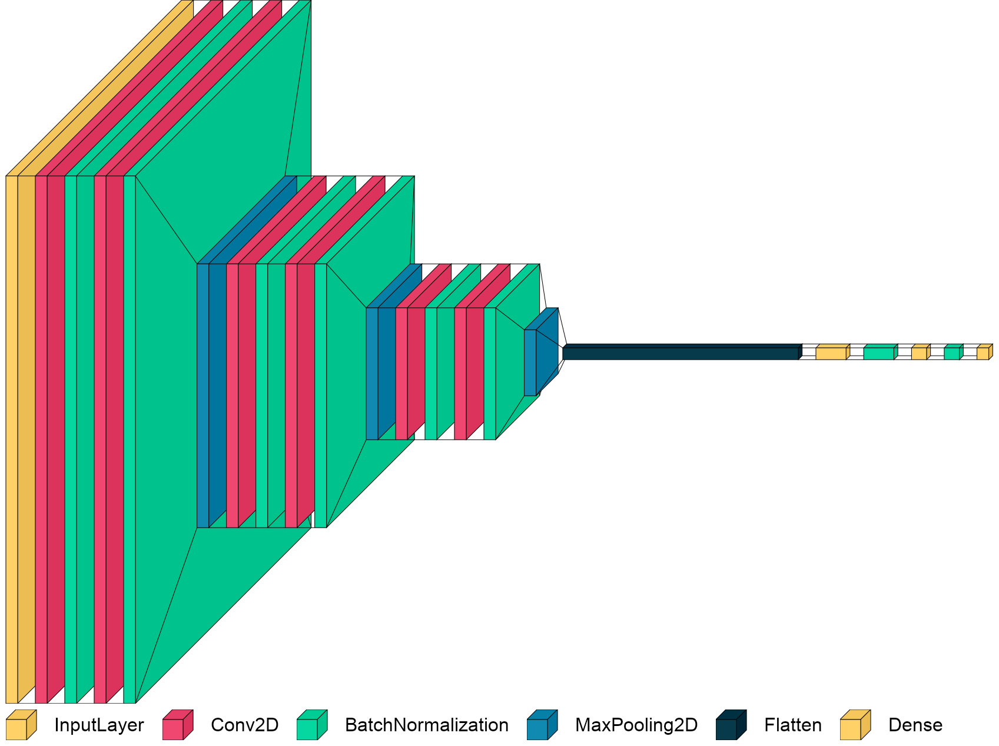

In [ ]:
# Define the input layer
input_layer = tf.keras.layers.Input(shape=(224, 224, 1))

# Define the first convolutional layer
conv_layer_1 = tf.keras.layers.Conv2D(32, (3, 3), padding='same', activation='relu')(input_layer)
conv_layer_1 = tf.keras.layers.BatchNormalization()(conv_layer_1)

# Define the second convolutional layer
conv_layer_2 = tf.keras.layers.Conv2D(32, (3, 3), padding='same', activation='relu')(conv_layer_1)
conv_layer_2 = tf.keras.layers.BatchNormalization()(conv_layer_2)

# Define the first max pooling layer
pool_layer_1 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(conv_layer_2)

# Define the third convolutional layer
conv_layer_3 = tf.keras.layers.Conv2D(64, (3, 3), padding='same', activation='relu')(pool_layer_1)
conv_layer_3 = tf.keras.layers.BatchNormalization()(conv_layer_3)

# Define the fourth convolutional layer
conv_layer_4 = tf.keras.layers.Conv2D(64, (3, 3), padding='same', activation='relu')(conv_layer_3)
conv_layer_4 = tf.keras.layers.BatchNormalization()(conv_layer_4)

# Define the second max pooling layer
pool_layer_2 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(conv_layer_4)

# Define the fifth convolutional layer
conv_layer_5 = tf.keras.layers.Conv2D(128, (3, 3), padding='same', activation='relu')(pool_layer_2)
conv_layer_5 = tf.keras.layers.BatchNormalization()(conv_layer_5)

# Define the sixth convolutional layer
conv_layer_6 = tf.keras.layers.Conv2D(128, (3, 3), padding='same', activation='relu')(conv_layer_5)
conv_layer_6 = tf.keras.layers.BatchNormalization()(conv_layer_6)

# Define the third max pooling layer
pool_layer_3 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(conv_layer_6)

# Define the flatten layer
flatten_layer = tf.keras.layers.Flatten()(pool_layer_3)

# Define the first fully connected layer
fc_layer_1 = tf.keras.layers.Dense(512, activation='relu')(flatten_layer)
fc_layer_1 = tf.keras.layers.BatchNormalization()(fc_layer_1)

#Define the second fully connected layer
fc_layer_2 = tf.keras.layers.Dense(256, activation='relu')(fc_layer_1)
fc_layer_2 = tf.keras.layers.BatchNormalization()(fc_layer_2)

#Define the output layer
output_layer = tf.keras.layers.Dense(3, activation='softmax')(fc_layer_2)

#Create the model
CNN_seq = tf.keras.models.Model(inputs=input_layer, outputs=output_layer)

## **Training the Model**

In [ ]:
optimizer = tf.keras.optimizers.Adam(learning_rate = learning_rate)

    
CNN_seq.compile(optimizer = optimizer, 
              loss = tf.keras.losses.CategoricalCrossentropy(label_smoothing = 0.1), 
              metrics = [tf.keras.metrics.CategoricalAccuracy(name="accuracy"),
                         tf.keras.metrics.TopKCategoricalAccuracy(5, name="top-5-accuracy"),
                        ],
             )


STEP_SIZE_TRAIN = train_gen.n // train_gen.batch_size
STEP_SIZE_VALID = valid_gen.n // valid_gen.batch_size
STEP_SIZE_TEST = test_gen.n // test_gen.batch_size

earlystopping = tf.keras.callbacks.EarlyStopping(monitor = 'val_loss',
                                                 min_delta = 0,
                                                 patience = 15,
                                                 mode = 'auto',
                                                 verbose = 1)

checkpointer = tf.keras.callbacks.ModelCheckpoint(filepath = './CNN_seq.hdf5',
                                                  monitor = 'val_accuracy', 
                                                  verbose = 1, 
                                                  save_best_only = True,
                                                  save_weights_only = True,
                                                  mode = 'max')

decay_steps = train_gen.n // train_gen.batch_size
initial_learning_rate = learning_rate
lr_decayed_fn = tf.keras.experimental.CosineDecay(initial_learning_rate, decay_steps)
lr_scheduler = tf.keras.callbacks.LearningRateScheduler(lr_decayed_fn)

callbacks = [earlystopping, lr_scheduler, checkpointer]

startTrain_seq = time()
history = CNN_seq.fit(x = train_gen,
          steps_per_epoch = STEP_SIZE_TRAIN,
          validation_data = valid_gen,
          validation_steps = STEP_SIZE_VALID,
          epochs = num_epochs,
          callbacks = callbacks)
time_passed_CCN_seq = time()-startTrain_seq

## Running time & memory occupation(complexity) of the model

In [ ]:
print("Trainable parameters: ",model.count_params() )

print("Running time: ",t.strftime("%Hh%Mm%Ss", t.gmtime(time_passed_CCN_seq)))

## Let's PREDICT!!

In [ ]:
test_gen.reset()
predY=CNN_seq.predict_generator(
        test_gen,
        steps=STEP_SIZE_TEST,
        verbose=1)
testY = test_gen.classes

## Confusion Matrix

915/915 [==============================] - 14s 15ms/step


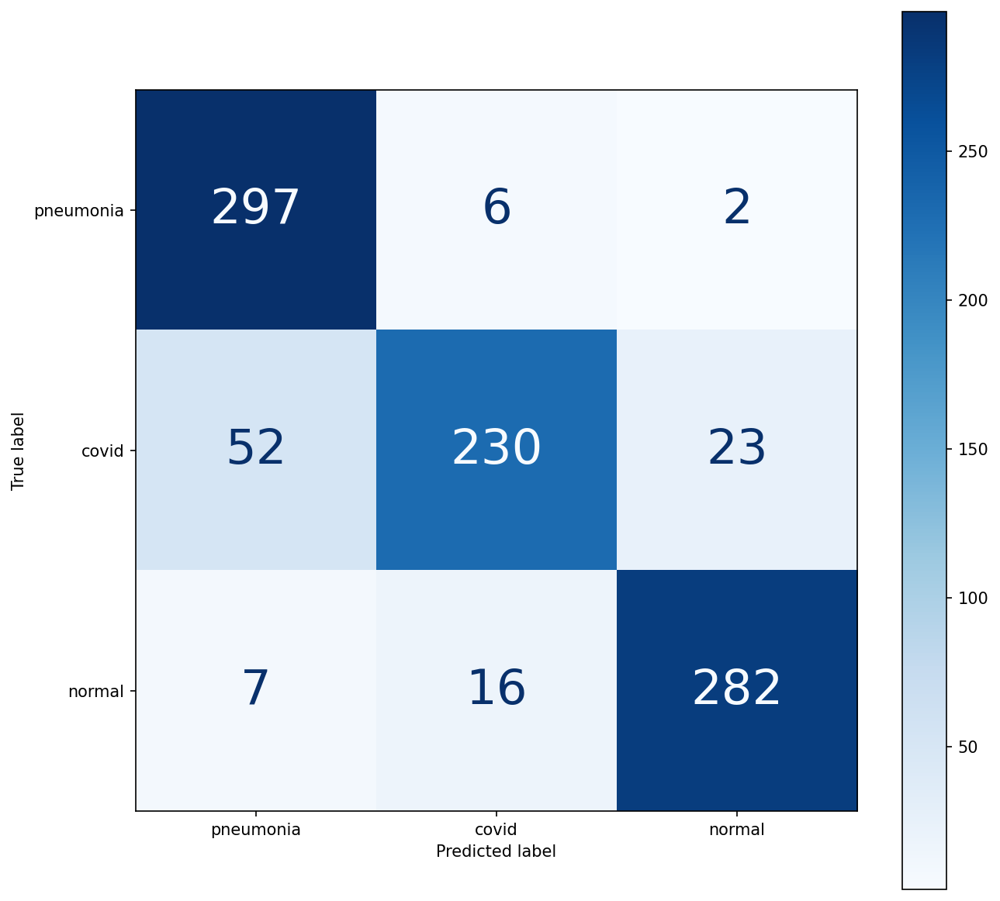

In [ ]:
cm = confusion_matrix(testY, np.argmax(predY, axis = -1)) # confusion matrix
cr=(classification_report(testY, np.argmax(predY, axis = -1), target_names=class_to_label_map, output_dict=True, digits=4)) #other scores

labels = class_to_label_map.keys()
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
fig, ax = plt.subplots(figsize=(10,10))
disp.plot(cmap=plt.cm.Blues,ax=ax)
for labels in disp.text_.ravel():
    labels.set_fontsize(30)
plt.show()

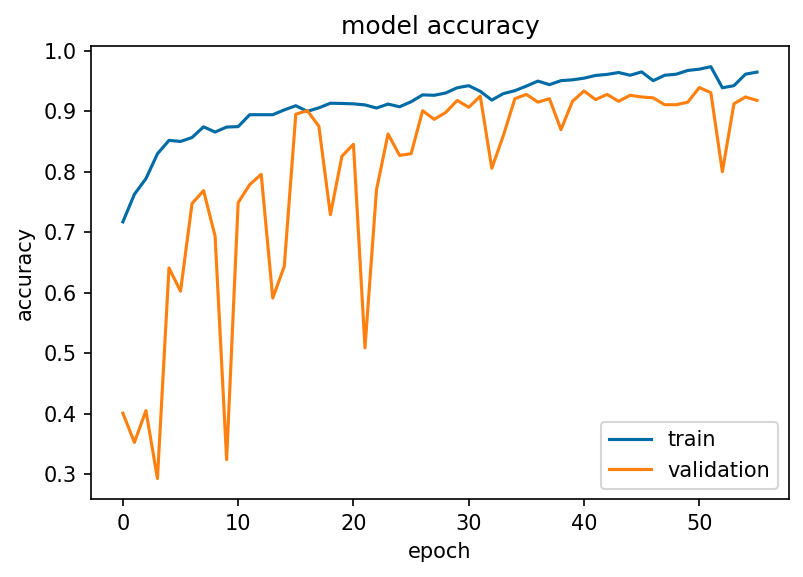

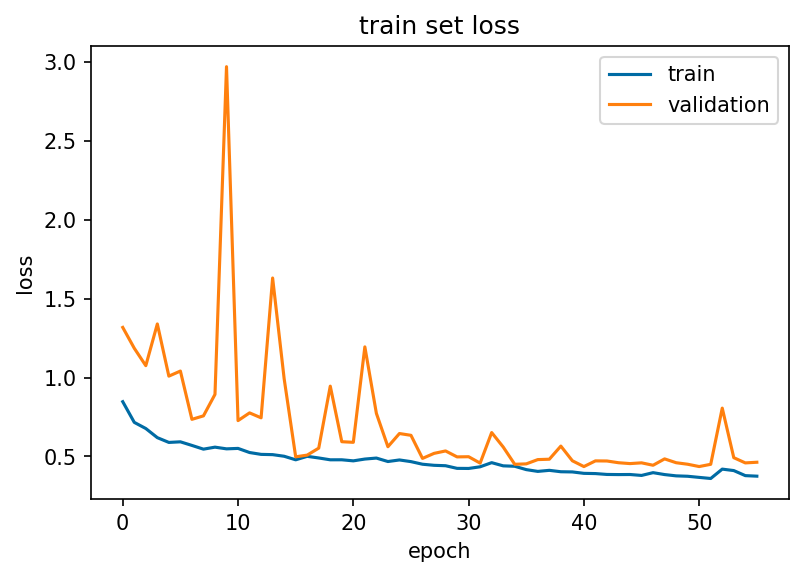

In [ ]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='lower right')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('train set loss')

plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()

## Save Model

In [ ]:
CNN_seq.save("CNN_seq")
np.save('history_CNN_seq.npy',history.history)

## Model Plot

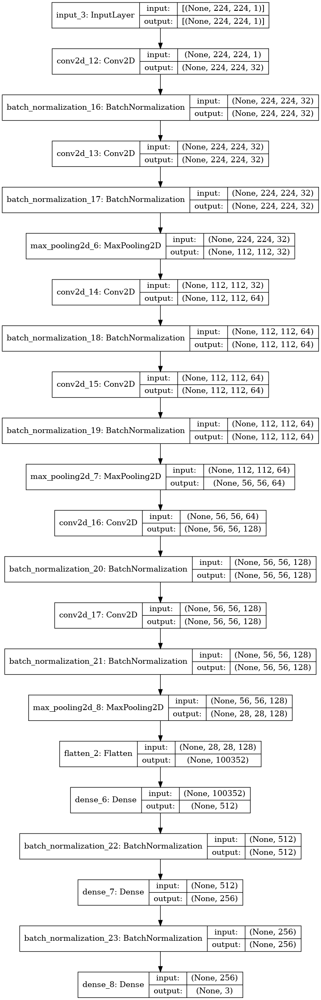

In [ ]:
tf.keras.utils.plot_model(CNN_seq, to_file='./CNN_seq.png', show_shapes=True, show_layer_names=True)

# **Model 2 -Custom Attention-Based CNN**
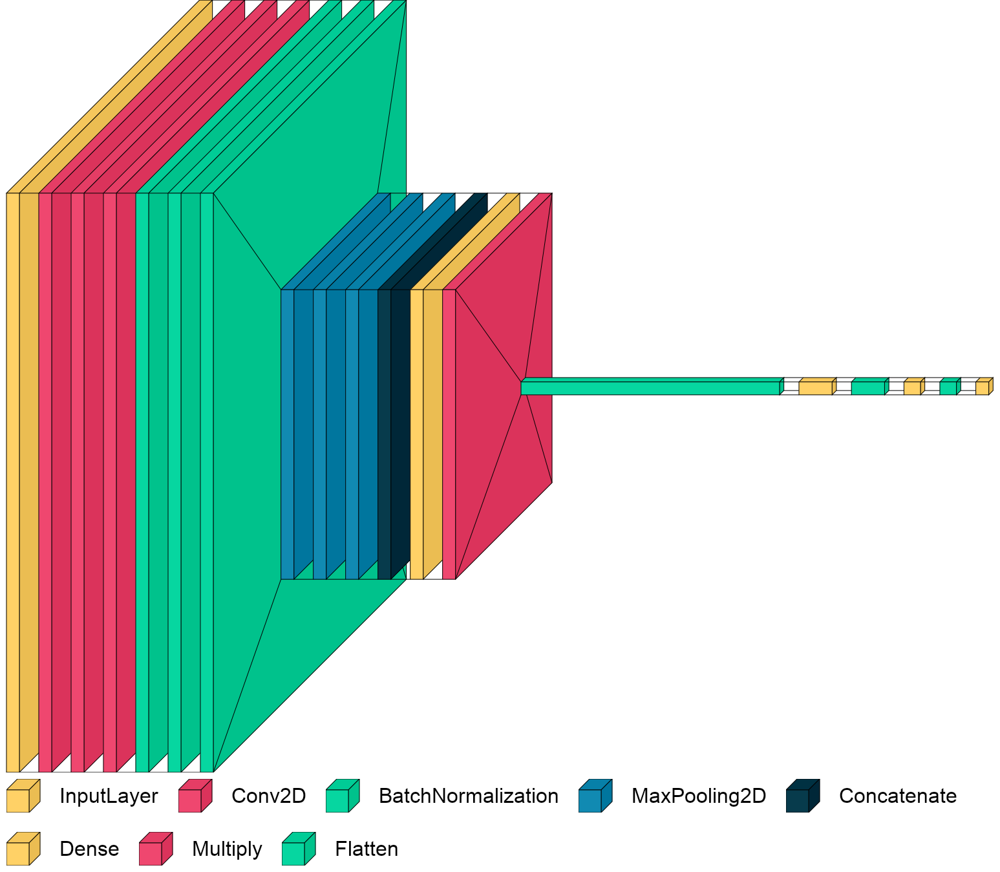

In [67]:
# Define the input layer
input_layer = tf.keras.layers.Input(shape=(224, 224, 1))

# Define the first parallel connection
parallel_1 = tf.keras.layers.Conv2D(32, (3, 3), padding='same', activation='relu')(input_layer)
parallel_1 = tf.keras.layers.BatchNormalization()(parallel_1)
parallel_1 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(parallel_1)

# Define the second parallel connection
parallel_2 = tf.keras.layers.Conv2D(32, (5, 5), padding='same', activation='relu')(input_layer)
parallel_2 = tf.keras.layers.BatchNormalization()(parallel_2)
parallel_2 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(parallel_2)

# Define the third parallel connection
parallel_3 = tf.keras.layers.Conv2D(32, (7, 7), padding='same', activation='relu')(input_layer)
parallel_3 = tf.keras.layers.BatchNormalization()(parallel_3)
parallel_3 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(parallel_3)

# Concatenate the outputs of the parallel connections
concatenated = tf.keras.layers.concatenate([parallel_1, parallel_2, parallel_3])

# Define the attention mechanism
attention_weights = tf.keras.layers.Dense(1, activation='softmax')(concatenated)
attention_output = tf.keras.layers.multiply([concatenated, attention_weights])

# Define the flatten layer
flatten_layer = tf.keras.layers.Flatten()(attention_output)

# Define the first fully connected layer
fc_layer_1 = tf.keras.layers.Dense(512, activation='relu')(flatten_layer)
fc_layer_1 = tf.keras.layers.BatchNormalization()(fc_layer_1)

# Define the second fully connected layer
fc_layer_2 = tf.keras.layers.Dense(256, activation='relu')(fc_layer_1)
fc_layer_2 = tf.keras.layers.BatchNormalization()(fc_layer_2)

# Define the output layer
output_layer = tf.keras.layers.Dense(3, activation='softmax')(fc_layer_2)

# Create the model
model_att = tf.keras.models.Model(inputs=input_layer, outputs=output_layer)

## **Training the Model**

In [ ]:
optimizer = tf.keras.optimizers.Adam(learning_rate = learning_rate)

    
model_att.compile(optimizer = optimizer, 
              loss = tf.keras.losses.CategoricalCrossentropy(label_smoothing = 0.1), 
              metrics = [tf.keras.metrics.CategoricalAccuracy(name="accuracy"),
                         tf.keras.metrics.TopKCategoricalAccuracy(5, name="top-5-accuracy"),
                        ],
             )


STEP_SIZE_TRAIN = train_gen.n // train_gen.batch_size
STEP_SIZE_VALID = valid_gen.n // valid_gen.batch_size
STEP_SIZE_TEST = test_gen.n // test_gen.batch_size

earlystopping = tf.keras.callbacks.EarlyStopping(monitor = 'val_loss',
                                                 min_delta = 0,
                                                 patience = 15,
                                                 mode = 'auto',
                                                 verbose = 1)

checkpointer = tf.keras.callbacks.ModelCheckpoint(filepath = './model_att.hdf5',
                                                  monitor = 'val_accuracy', 
                                                  verbose = 1, 
                                                  save_best_only = True,
                                                  save_weights_only = True,
                                                  mode = 'max')

decay_steps = train_gen.n // train_gen.batch_size
initial_learning_rate = learning_rate
lr_decayed_fn = tf.keras.experimental.CosineDecay(initial_learning_rate, decay_steps)
lr_scheduler = tf.keras.callbacks.LearningRateScheduler(lr_decayed_fn)

callbacks = [earlystopping, lr_scheduler, checkpointer]

startTrain_att = time()
history = model_att.fit(x = train_gen,
          steps_per_epoch = STEP_SIZE_TRAIN,
          validation_data = valid_gen,
          validation_steps = STEP_SIZE_VALID,
          epochs = num_epochs,
          callbacks = callbacks)
time_passed_model_att = time()-startTrain_att

## Running time & memory occupation(complexity) of the model

In [ ]:
print("Trainable parameters: ",CNN_parallel.count_params() )

print("Running time: ",t.strftime("%Hh%Mm%Ss", t.gmtime(time_passed_model_att)))

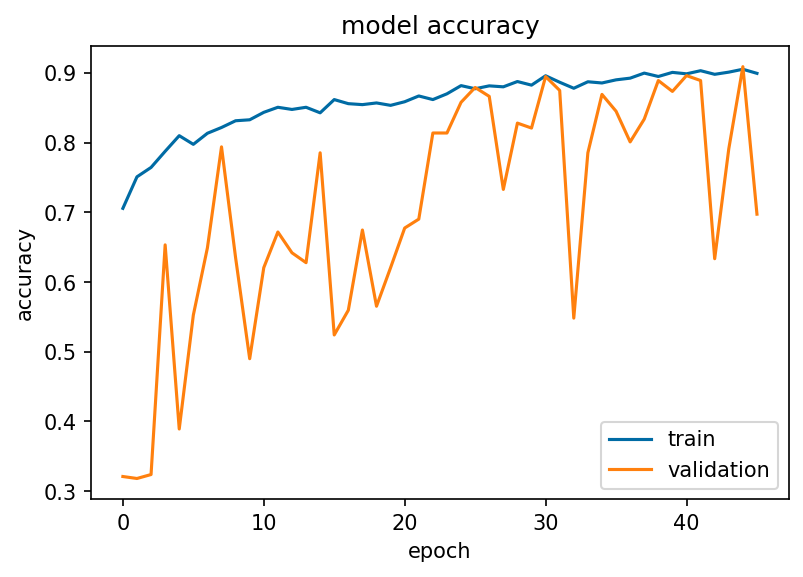

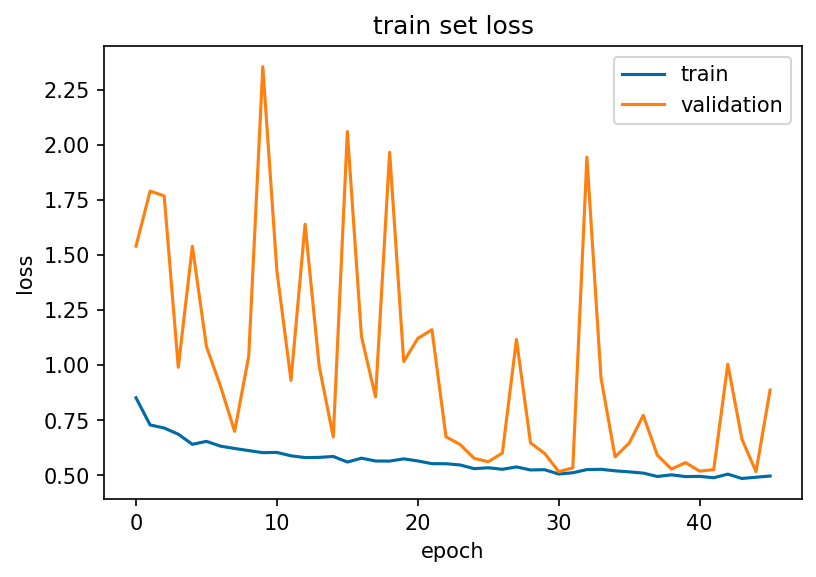

In [ ]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='lower right')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('train set loss')

plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()

## Let's PREDICT!!

In [ ]:
test_gen.reset()
predY=model_att.predict_generator(
        test_gen,
        steps=STEP_SIZE_TEST,
        verbose=1)
testY = test_gen.classes

## Confusion Matrix

915/915 [==============================] - 15s 17ms/step


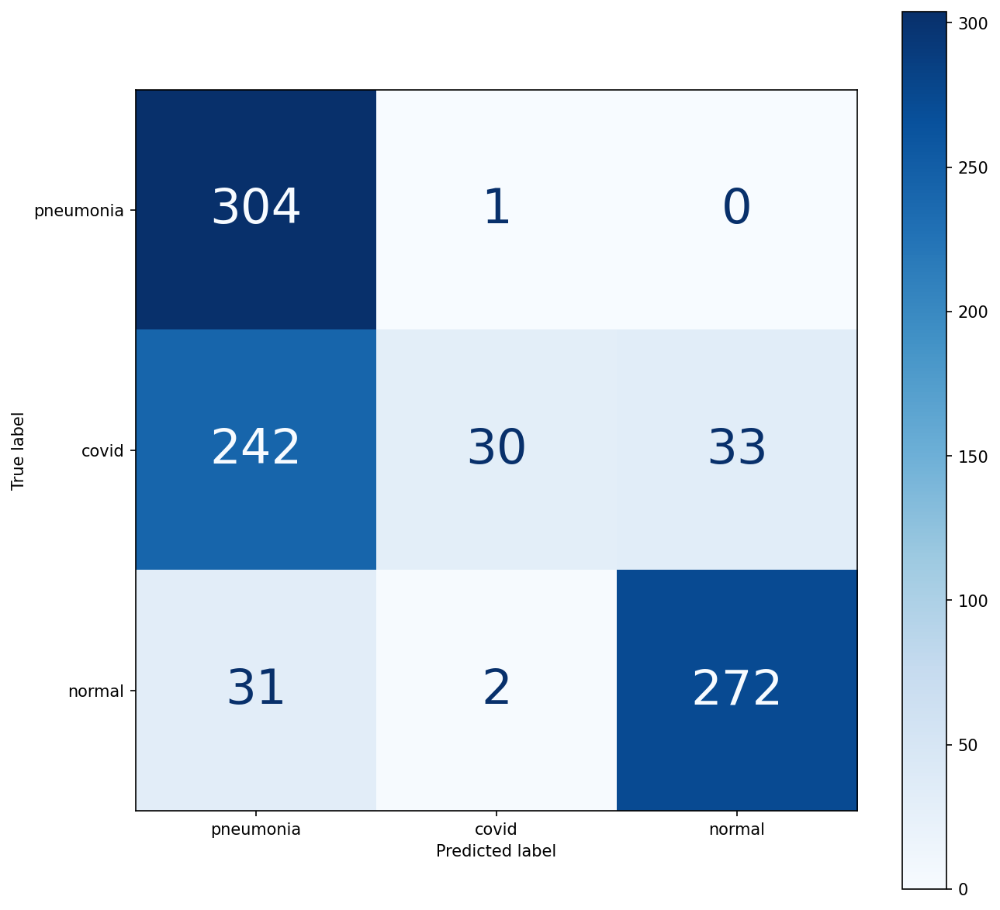

In [ ]:
cm = confusion_matrix(testY, np.argmax(predY, axis = -1)) # confusion matrix
cr=(classification_report(testY, np.argmax(predY, axis = -1), target_names=class_to_label_map, output_dict=True, digits=4)) #other scores

labels = class_to_label_map.keys()
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
fig, ax = plt.subplots(figsize=(10,10))
disp.plot(cmap=plt.cm.Blues,ax=ax)
for labels in disp.text_.ravel():
    labels.set_fontsize(30)
plt.show()

## Save Model

In [ ]:
CNN_attention.save("CNN_attention")
np.save('history_CNN_attention.npy',history.history)

## Model Plot

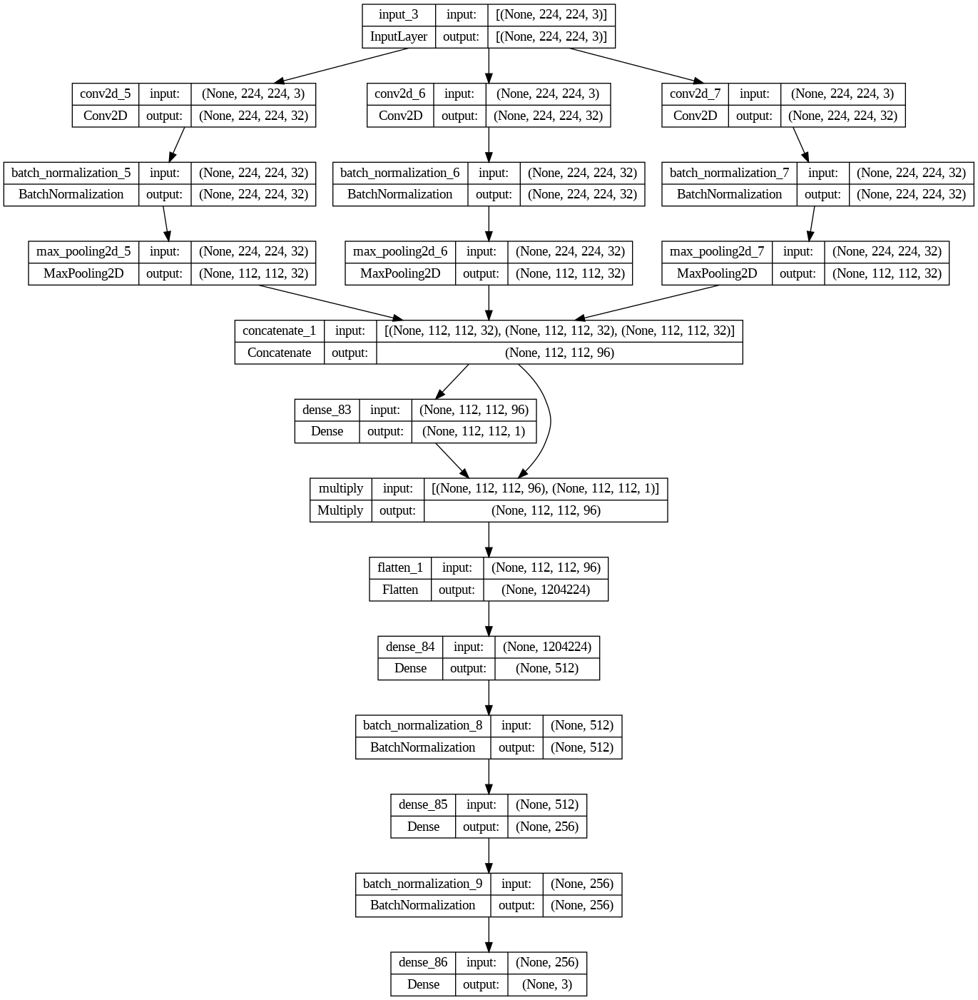

In [68]:
tf.keras.utils.plot_model(model_att, to_file='./CNN_attention.png', show_shapes=True, show_layer_names=True)

# **Ensemble Modeling**

In [ ]:
CNN_Sequential = tf.keras.models.load_model('saved_models/CNN_seq')
CNN_Attention = tf.keras.models.load_model('saved_models/CNN_attention')

In [ ]:
from sklearn.ensemble import VotingClassifier

In [ ]:
# Ensemble of Models 
estimator = [] 
estimator.append(('CNN_Sequential', CNN_Sequential))
estimator.append(('CNN_Attention', CNN_Attention)) 

In [ ]:
print(estimator)

In [ ]:
STEP_SIZE_TRAIN = train_gen.n // train_gen.batch_size
STEP_SIZE_VALID = valid_gen.n // valid_gen.batch_size
STEP_SIZE_TEST = test_gen.n // test_gen.batch_size

In [ ]:
test_gen.reset()
pred_CNN_Sequential=CNN_Sequential.predict_generator(
        test_gen,
        steps=STEP_SIZE_TEST,
        verbose=1)

915/915 [==============================] - 63s 69ms/step


In [ ]:
test_gen.reset()
pred_CNN_Attention=CNN_Attention.predict_generator(
        test_gen,
        steps=STEP_SIZE_TEST,
        verbose=1)

915/915 [==============================] - 130s 141ms/step


In [ ]:
stack=np.dstack((pred_CNN_Sequential,pred_CNN_Attention))
avg_ensemble_prob=np.mean(stack,axis=-1)
avg_ensemble_pred=np.argmax(avg_ensemble_prob,axis=-1)

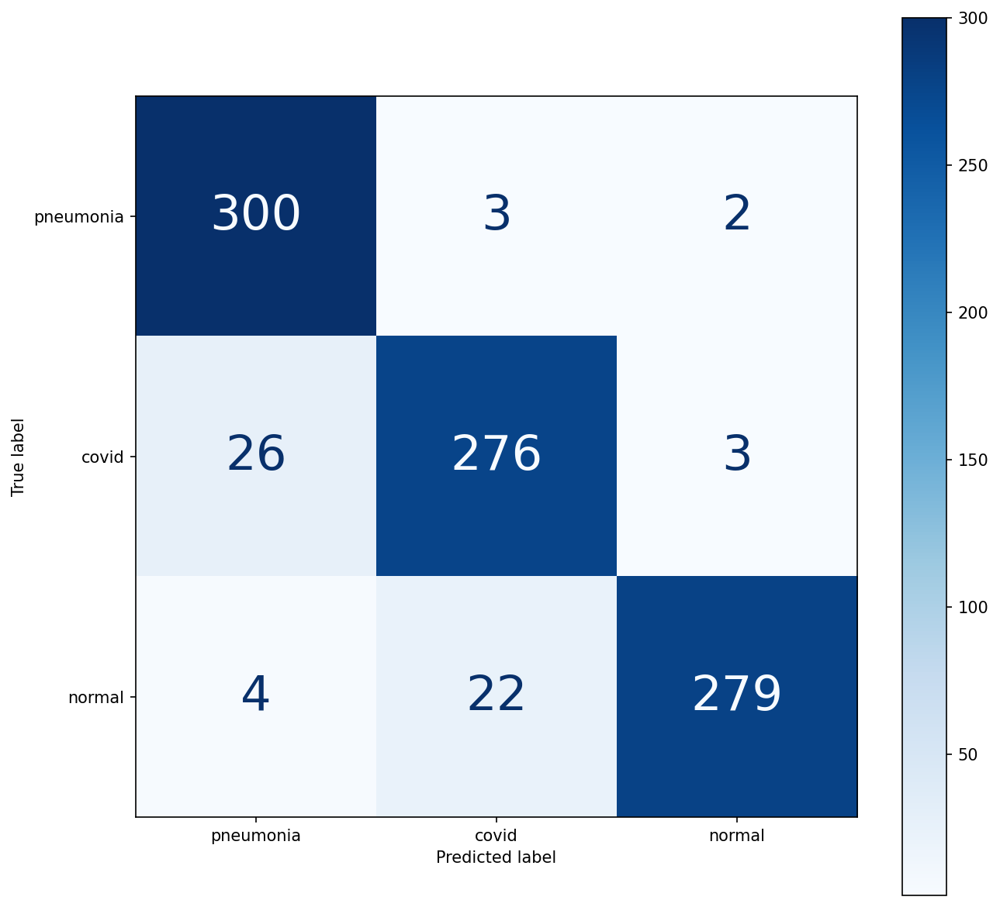

In [ ]:
cm = confusion_matrix(testY, avg_ensemble_pred) # confusion matrix
cr=(classification_report(testY, avg_ensemble_pred, target_names=class_to_label_map, output_dict=True, digits=4)) #other scores

labels = class_to_label_map.keys()
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
fig, ax = plt.subplots(figsize=(10,10))
disp.plot(cmap=plt.cm.Blues,ax=ax)
for labels in disp.text_.ravel():
    labels.set_fontsize(30)
plt.savefig('ensemble_conf.png', dpi=1200)
plt.show()

In [ ]:
fig, ax = plt.subplots(figsize=(10,10)) 
sns.heatmap(pd.DataFrame(cr).iloc[:-1, :].T, annot=True, ax=ax)

In [ ]:
cr1=(classification_report(testY, avg_ensemble_pred, target_names=class_to_label_map, output_dict=True, digits=4)) #other scores
cr2=(classification_report(testY, np.argmax(pred_ViT, axis = -1), target_names=class_to_label_map, output_dict=True, digits=4)) #other scores
cr3=(classification_report(testY, np.argmax(pred_CCT, axis = -1), target_names=class_to_label_map, output_dict=True, digits=4)) #other scores
cr4=(classification_report(testY, np.argmax(pred_CNN_Sequential, axis = -1), target_names=class_to_label_map, output_dict=True, digits=4)) #other scores
cr6=(classification_report(testY, np.argmax(pred_CNN_Attention, axis = -1), target_names=class_to_label_map, output_dict=True, digits=4)) #other scores

print("ViT Accuracy:" + str(cr2['accuracy']))
print("CCT Accuracy:" + str(cr3['accuracy']))
print("CNN_Sequential Accuracy:" + str(cr4['accuracy']))
print("CNN_Attention Accuracy:" + str(cr6['accuracy']))
print("Ensemble Accuracy:" + str(cr1['accuracy']))


# **Grad-Cam**

In [ ]:
y_val = test_gen.classes
y_pred = CNN_Attention.predict(test_gen)
confidence = np.max(y_pred,axis=1)
y_pred = np.argmax(y_pred,axis=1)
print(classification_report(y_val,y_pred))

2023-01-21 11:51:52.293246: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)


              precision    recall  f1-score   support

           0       0.86      0.99      0.92       305
           1       0.92      0.82      0.86       305
           2       0.96      0.91      0.93       305

    accuracy                           0.91       915
   macro avg       0.91      0.91      0.91       915
weighted avg       0.91      0.91      0.91       915



In [ ]:
class_indices = test_gen.class_indices
indices = {v:k for k,v in class_indices.items()}

In [ ]:
filenames = test_gen.filenames

In [ ]:
result_df = pd.DataFrame()
result_df['filename'] = filenames
result_df['actual'] = y_val
result_df['predicted'] = y_pred
result_df['actual'] = result_df['actual'].apply(lambda x: indices[x])
result_df['predicted'] = result_df['predicted'].apply(lambda x: indices[x])
result_df.loc[result_df['actual']==result_df['predicted'],'Same'] = True
result_df.loc[result_df['actual']!=result_df['predicted'],'Same'] = False
result_df['confidence'] = confidence
result_df.head(10)

,filename,actual,predicted,Same,confidence
0,covid/1B734A89-A1BF-49A8-A1D3-66FAFA4FAC5D-768...,covid,covid,True,0.948211
1,covid/353889E0-A1E8-4F9E-A0B8-F24F36BCFBFB-768...,covid,covid,True,0.990051
2,covid/7E335538-2F86-424E-A0AB-6397783A38D0-768...,covid,covid,True,0.900064
3,covid/B2D20576-00B7-4519-A415-72DE29C90C34-768...,covid,covid,True,0.763555
4,covid/COVID-19 (1).jpeg,covid,covid,True,0.965541
5,covid/COVID-19 (1).jpg,covid,covid,True,0.805300
6,covid/COVID-19 (103).jpg,covid,covid,True,0.916334
7,covid/COVID-19 (105).jpg,covid,covid,True,0.957249
8,covid/COVID-19 (111).jpg,covid,covid,True,0.903266
9,covid/COVID-19 (114).jpg,covid,covid,True,0.880110


In [ ]:
result_df = result_df.sample(frac=1).reset_index(drop=True)

In [ ]:
from tensorflow.keras.preprocessing.image import array_to_img, img_to_array, load_img
def readImage(path):
    img = load_img(path,color_mode='grayscale',target_size=(image_size,image_size))
    img = img_to_array(img)
    img = img/255.
    
    return img

def display_images(temp_df):
    temp_df = temp_df.reset_index(drop=True)
    plt.figure(figsize = (20 , 20))
    n = 0
    for i in range(15):
        n+=1
        plt.subplot(5 , 5, n)
        plt.subplots_adjust(hspace = 0.5 , wspace = 0.3)
        image = readImage(f"{temp_df.filename[i]}")
        plt.imshow(image)
        plt.title("Actual Class:" + str(temp_df.actual[i]) + "\n" + "Predicted Class:" + str(temp_df.predicted[i]) + "\n" + "Confidence:" + str(temp_df.confidence[i]))

Correctly Classified Images

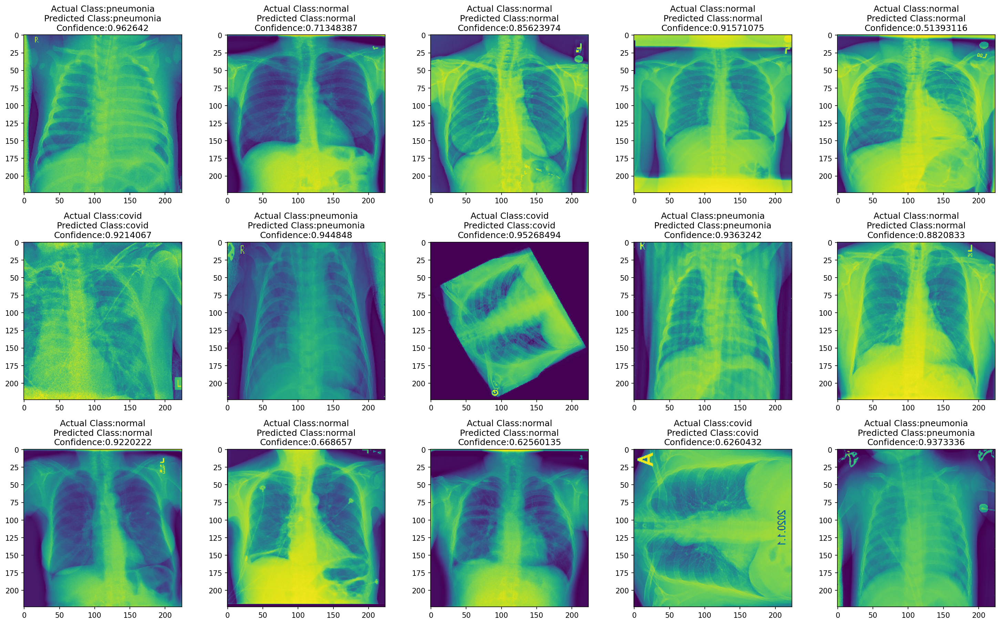

In [ ]:
display_images(result_df[result_df['Same']==True])
plt.tight_layout()
plt.savefig('confidence', dpi=1200)

Mislassified Images

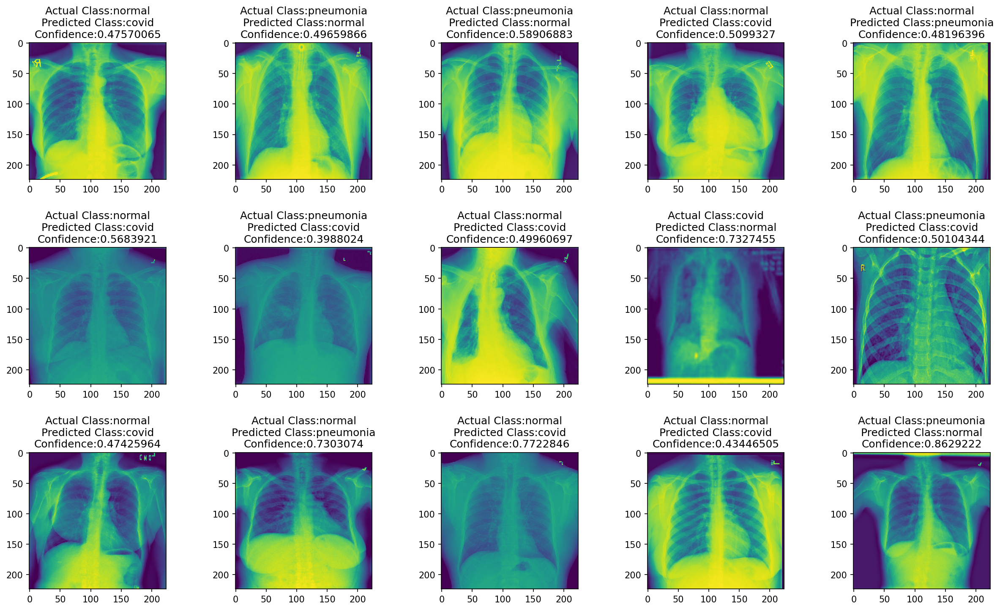

In [ ]:
display_images(result_df[result_df['Same']!=True])

In [ ]:
def make_gradcam_heatmap(img_array, model, pred_index=None):
    
    grad_model = Model(inputs=model.inputs, outputs=[model.layers[-9].output, model.output])

    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    grads = tape.gradient(class_channel, last_conv_layer_output)

    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy(), preds

In [ ]:
import matplotlib.cm as cm
from tensorflow.keras.models import Model
result_df

,filename,actual,predicted,Same,confidence
0,normal/00000798_000.png,normal,covid,False,0.475701
1,pneumonia/person23_bacteria_83.jpeg,pneumonia,pneumonia,True,0.962642
2,normal/00000554_001.png,normal,normal,True,0.713484
3,normal/00000743_001.png,normal,normal,True,0.856240
4,normal/00000960_000.png,normal,normal,True,0.915711
...,...,...,...,...,...
910,normal/00000091_006.png,normal,normal,True,0.521440
911,covid/COVID-19 (1).jpg,covid,covid,True,0.805300
912,covid/COVID-19 (303).jpg,covid,covid,True,0.991388
913,covid/COVID-19 (44).jpg,covid,covid,True,0.955444


In [ ]:
def gradCAMImage(image):
    path = f"/test/{image}"
    img = readImage(path)
    img = np.expand_dims(img,axis=0)
    heatmap,preds = make_gradcam_heatmap(img,CNN_Sequential)

    img = load_img(path)
    img = img_to_array(img)
    heatmap = np.uint8(255 * heatmap)

    # Use jet colormap to colorize heatmap
    jet = cm.get_cmap("jet")

    # Use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # Create an image with RGB colorized heatmap
    jet_heatmap = tf.keras.preprocessing.image.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = tf.keras.preprocessing.image.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * 0.8 + img
    superimposed_img = tf.keras.preprocessing.image.array_to_img(superimposed_img)
    
    return superimposed_img

In [ ]:
def gradcam_of_images(correct_class):
    grad_images = []
    title = []
    temp_df = result_df[result_df['Same']==correct_class]
    temp_df = temp_df.reset_index(drop=True)
    for i in range(15):
        image = temp_df.filename[i]
        grad_image = gradCAMImage(image)
        grad_images.append(grad_image)
        title.append(f"A: {temp_df.actual[i]} P: {temp_df.predicted[i]}")

    return grad_images, title

In [ ]:
correctly_classified, c_titles = gradcam_of_images(correct_class=True)
misclassified, m_titles = gradcam_of_images(correct_class=False)

In [ ]:
def display_heatmaps(classified_images,titles,name):
    plt.figure(figsize = (20 , 20))
    n = 0
    for i in range(15):
        n+=1
        plt.subplot(5 , 5, n)
        plt.subplots_adjust(hspace = 0.5 , wspace = 0.3)
        plt.imshow(classified_images[i])
        plt.title(titles[i])
    #plt.tight_layout()
    #plt.savefig(name, dpi=1200)
    plt.show()

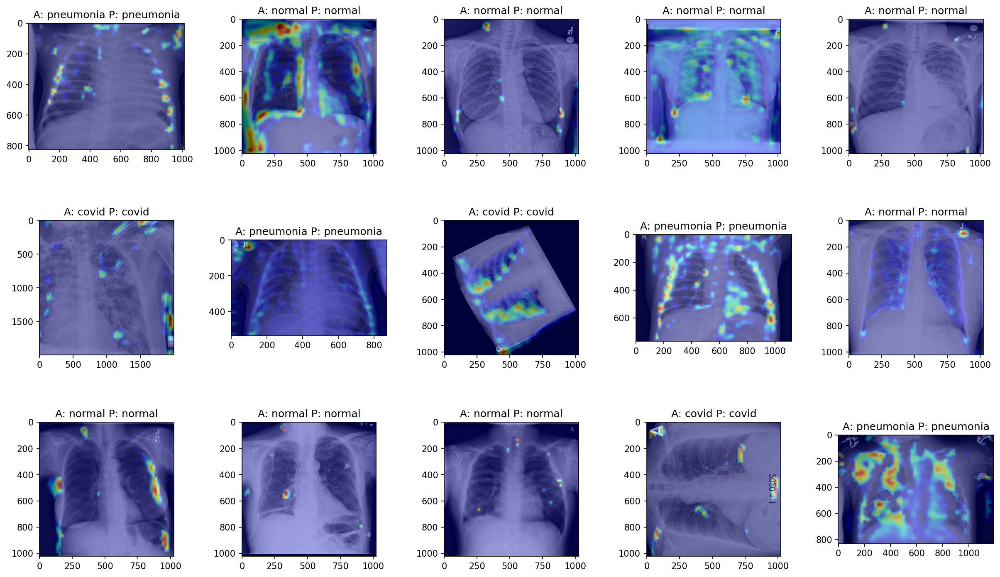

In [ ]:
display_heatmaps(correctly_classified,c_titles,'correctly_classified')


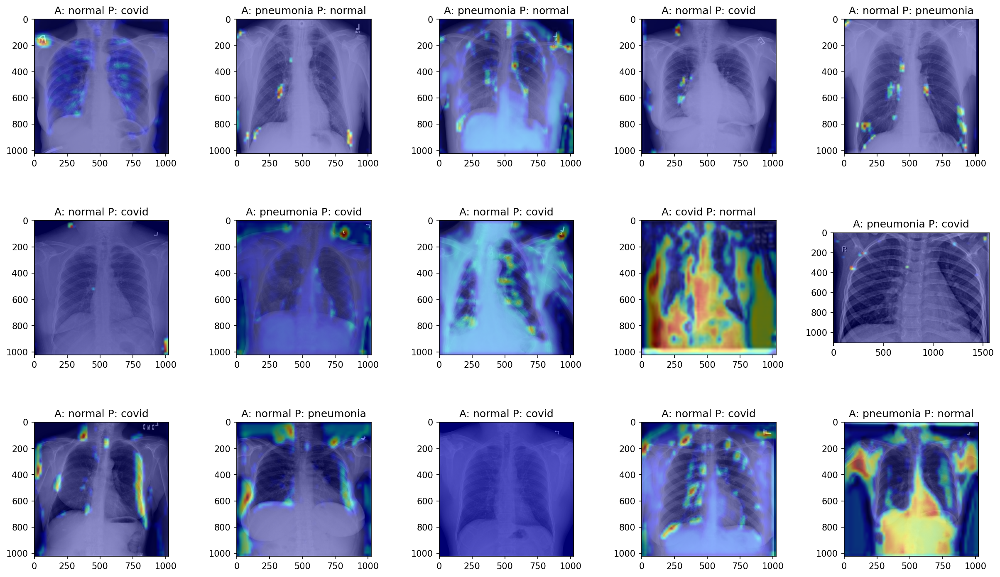

In [ ]:
display_heatmaps(misclassified,m_titles,'misclassified')

# PLOTS

In [ ]:
history_Seq=np.load('history_CNN_attention.npy',allow_pickle='TRUE').item()
history_Att=np.load('history_CNN_seq.npy',allow_pickle='TRUE').item()

In [ ]:
plt.plot(history_Seq['accuracy'])
plt.plot(history_Att['accuracy'])
#plt.title('Train Accuracy')
plt.ylabel('Train Accuracy')
plt.xlabel('Epoch')
plt.legend(['Sequential CNN', 'Attention-based CNN'], loc='lower right')
plt.tight_layout()
plt.savefig('train_accuracy.png', dpi=1200)
plt.show()

In [ ]:
plt.plot(history_Seq['val_accuracy'])
plt.plot(history_Att['val_accuracy'])
plt.ylabel('Validation Accuracy')
plt.xlabel('Epoch')
plt.legend(['Sequential CNN', 'Attention-based CNN'], loc='lower right')
plt.tight_layout()
plt.savefig('validation_accuracy.png', dpi=1200)
plt.show()

In [ ]:
plt.plot(history_Seq['loss'])
plt.plot(history_Att['loss'])
plt.ylabel('Train Set Loss')
plt.xlabel('Epoch')
plt.legend(['Sequential CNN', 'Attention-based CNN'], loc='upper right')
plt.tight_layout()
plt.savefig('train_loss.png', dpi=1200)
plt.show()

In [ ]:
plt.plot(history_Seq['val_loss'])
plt.plot(history_Att['val_loss'])
plt.ylabel('Validation Set Loss')
plt.xlabel('Epoch')
plt.legend(['Sequential CNN', 'Attention-based CNN'], loc='upper right')
plt.tight_layout()
plt.savefig('val_loss.png', dpi=1200)
plt.show()